# Assignment 2 - LDA
### Dragoș Spiridon


In [ ]:
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import LatentDirichletAllocation as LDA

%matplotlib inline

Import files:

In [ ]:
main_path = Path("/content/drive/MyDrive/weizmann_horse_db")
dirs = [x for x in main_path.iterdir()]
images_path = [x for x in sorted(dirs[0].iterdir())]
masks_path = [x for x in sorted(dirs[1].iterdir())]

images = [cv2.imread(str(x)) for x in images_path]
masks = [cv2.imread(str(x), cv2.IMREAD_ANYDEPTH) for x in masks_path]

Let's see first how SIFT from OpenCV works over an image

[]

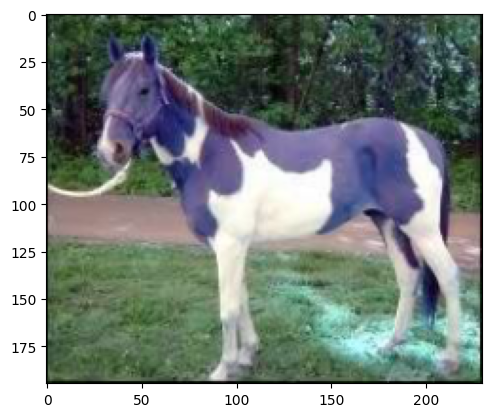

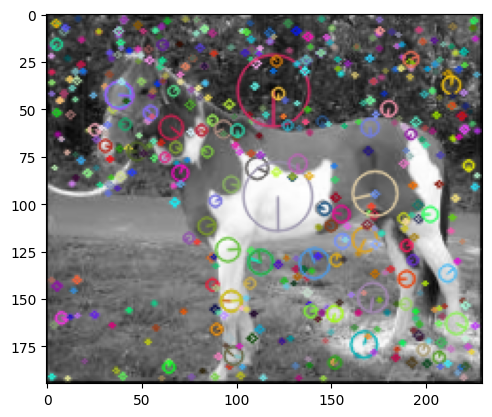

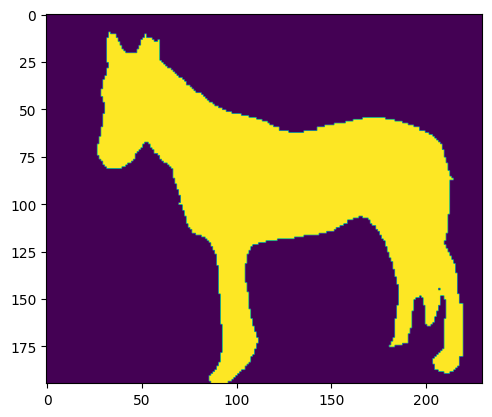

In [ ]:
img1 = np.array(images[16]).copy()

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
plt.imshow(img1)
plt.plot()
plt.figure()
#keypoints
sift = cv2.xfeatures2d.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img_1)
plt.plot()
plt.figure()
plt.imshow(masks[16])
plt.plot()

Calculate the descriptor for each image

In [ ]:
def create_SIFT_descriptors(images):
  images_descriptors = []
  images_keypoints = []
  for img in images:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    sift = cv2.xfeatures2d.SIFT_create()

    keypoints, descriptors = sift.detectAndCompute(img,None)

    images_descriptors.append(descriptors)
    images_keypoints.append(keypoints)

  return images_keypoints, images_descriptors

images_keypoints, images_descriptors = create_SIFT_descriptors(images)

Separate into train/ test (only 10 images for test)

In [ ]:
X_train_all, X_test_all, Y_train, y_test = train_test_split(list(zip(images, images_keypoints,images_descriptors)), masks, test_size=0.03, random_state=42)
len(y_test)

10

In [ ]:
# I need the keypoints for showing them, so I had to modify a bit train_test_split
X_train_images, X_train_keypoints, X_train  = zip(*X_train_all)
X_test_images, X_test_keypoints, X_test  = zip(*X_test_all)

# First experiment

Apply K-means over the SIFT descriptors (we will choose 100 k-clusters).

In [ ]:
k = 100
kmeans = KMeans(k, n_init='auto')

X_train_reformed = np.concatenate(X_train, axis=0)
print(X_train_reformed.shape)

np.random.shuffle(X_train_reformed)
X_train_smaller = X_train_reformed[:100000]
print(X_train_smaller.shape)

kmeans.fit(X_train_smaller)

(647579, 128)
(100000, 128)


KMeans(n_clusters=100, n_init='auto')

In [ ]:
kmeans.cluster_centers_.shape

(100, 128)

We are at the step where we make the bag of visual terms: by calculating the nearest k-cluster for each descriptor, and then apply a histogram for each cluster. Firstly, we will test it for the descriptors of one image.

Shape of the descriptors of one image: (2594, 128)
Shape after substractions: (100, 2594, 128)
Shape after calculating the Euclidian distance: (100, 2594)
Shape after finding the nearest k-cluster: (2594,)


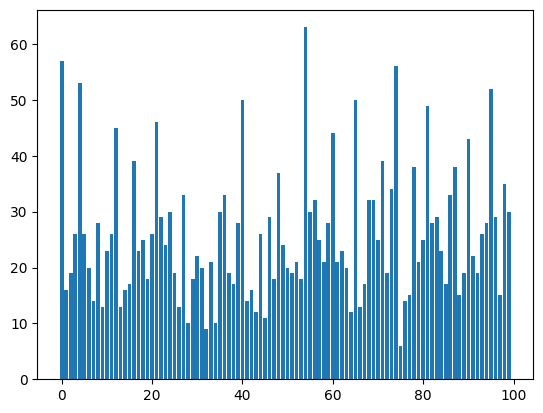

In [ ]:
clusters = kmeans.cluster_centers_

# a cool feature in broadcasting I found
# instead of substracting each image descrptor to each cluster
# we can just easily manipulate the broadcasing feature
# by adding a 1-shape to the clusters
print("Shape of the descriptors of one image:", images_descriptors[0].shape)
distances = images_descriptors[0] - clusters[:,None]
print("Shape after substractions:", distances.shape)
# now apply the norm which will result the euclidian distance
a = np.linalg.norm(distances, axis=2)
print("Shape after calculating the Euclidian distance:", a.shape)
# finding the closest k-neighbor (the arg will print its position)
a = np.argmin(a, axis=0)
print("Shape after finding the nearest k-cluster:", a.shape)
# print("All the clusters which were found:", np.unique(a)) # all of the cluster's id
a = np.histogram(a, np.arange(k + 1))
# print("Histogram:", a[0])
plt.bar(a[1][:-1], a[0])
plt.show()

Apply it to all train and test descriptor images and save the histogram

In [ ]:
X_train_hist = []
X_test_hist = []

# for training images
for image_descriptors in X_train:
  # nevermind there is already a function "predict" in that manner
  nearest_k = kmeans.predict(image_descriptors)
  X_train_hist.append(np.histogram(nearest_k, np.arange(k + 1))[0])

# for test images as well
for image_descriptors in X_test:
  nearest_k = kmeans.predict(image_descriptors)
  X_test_hist.append(np.histogram(nearest_k, np.arange(k + 1))[0])

Now, we have our bag of visual terms. Now it's time to train our LDA and use it for predicting the most likely topic

In [ ]:
lda = LDA(n_components=5)

# welp, that was easy to train
lda.fit(X_train_hist);

In [ ]:
# by transforming, it gives us a probability distribution which is summed up to one
test_index = 0
a = lda.transform([X_test_hist[test_index]])[0]
np.set_printoptions(precision=5, suppress=True)
print("The predictions by each topic:", a)
print(a.sum())
top_topics = (-a).argsort()
print("Most probable topics in order:", top_topics)

The predictions by each topic: [0.00016 0.11546 0.70873 0.17549 0.00016]
1.0000000000000002
Most probable topics in order: [2 3 1 4 0]


In the case of the first test image descriptor, the most probable topic is topic 2. Let's see where are those descriptors on the image:

In [ ]:
def draw_keypoints(lda, component_number, nearest_k, keypoints, img, maxx, color=(0,0,255), print_args_clusters=True):
  args_clusters = (-lda.components_[component_number]).argsort()
  if print_args_clusters:
    print(args_clusters[:maxx])
  args = np.argwhere(np.isin(nearest_k, args_clusters[:maxx])).squeeze()
  show_keypoints = np.array(keypoints)[args]

  return cv2.drawKeypoints(img, show_keypoints, 0, color, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

[12  4  0 54 69 40 21 65 95 55 81 68]
[69  4 34 25 35 21 64 55  8 68 20 88]
[34 63 64 46 18  3 94 12  0 81 95 39]


[]

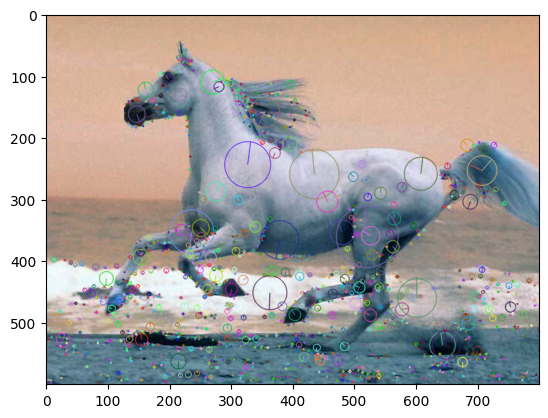

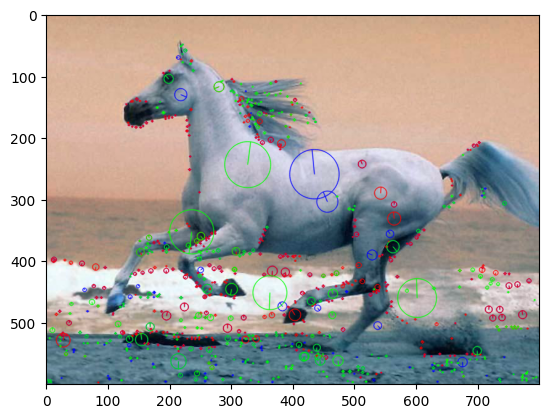

In [ ]:
# we calculate again the nearest k-cluster
nearest_k = kmeans.predict(X_test[test_index])

img = cv2.drawKeypoints(X_test_images[test_index], X_test_keypoints[test_index], 0, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img)
plt.figure()

img = draw_keypoints(lda, top_topics[0], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], 12, (0,0,255))
img = draw_keypoints(lda, top_topics[1], nearest_k, X_test_keypoints[test_index], img, 12, (255,0,0))
img = draw_keypoints(lda, top_topics[2], nearest_k, X_test_keypoints[test_index], img, 12, (0,255,0))

plt.imshow(img)
plt.plot()

We see that on this test image, the blue part takes the keypoints which are on the horse (mainly on the body and ears, some edges on the leg as well), and the green one seems to have detected hair parts of the horse (also on the legs).

The most interesting one topic is the red one (which also has the greatest probability as topic), as it mostly defines the edges of the horse and also the edges of the waves. It really does a great job in that matter. Now let's observe the image with a different size of k-clusters chosen:


PS: I recommend to zoom in on the image plots, the colors are not amazing for the pictures.

Topic 2 for Test Image 0
[12  4]
[12  4  0 54 69]
[12  4  0 54 69 40 21 65 95 55]
[12  4  0 54 69 40 21 65 95 55 81 68 35 94 76]
[12  4  0 54 69 40 21 65 95 55 81 68 35 94 76 98 25 39 78  8]
[12  4  0 54 69 40 21 65 95 55 81 68 35 94 76 98 25 39 78  8 60 86 48 16
 97 24 96 44 23 20]


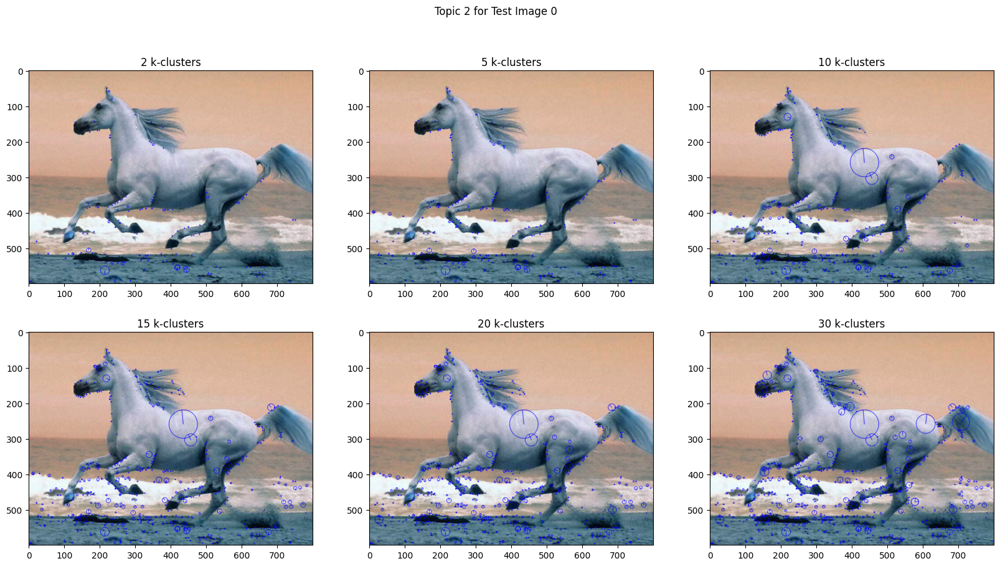

In [ ]:
fig, axs = plt.subplots(2,3)
fig.set_figheight(10)
fig.set_figwidth(20)
print("Topic {} for Test Image 0".format(top_topics[0]))
for i, no in enumerate([2, 5, 10, 15, 20, 30]):
  img = draw_keypoints(lda, top_topics[0], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], no, (0,0,255))
  axs[i // 3, i % 3].imshow(img)

  axs[i // 3, i % 3].title.set_text("{} k-clusters".format(no))

fig.suptitle("Topic {} for Test Image 0".format(top_topics[0]))
fig.show()

Really interesting that the first 2 k-clusters already go to the topic of edges of the horse. From the first five clusters, it is observed that the line between the wave and the sea is also taken. From my perspective, only the first 10 clusters are taken the most important details.

Now, let's also observe the second topic, and after that, try with another test image.

Topic 3 for Test Image 1


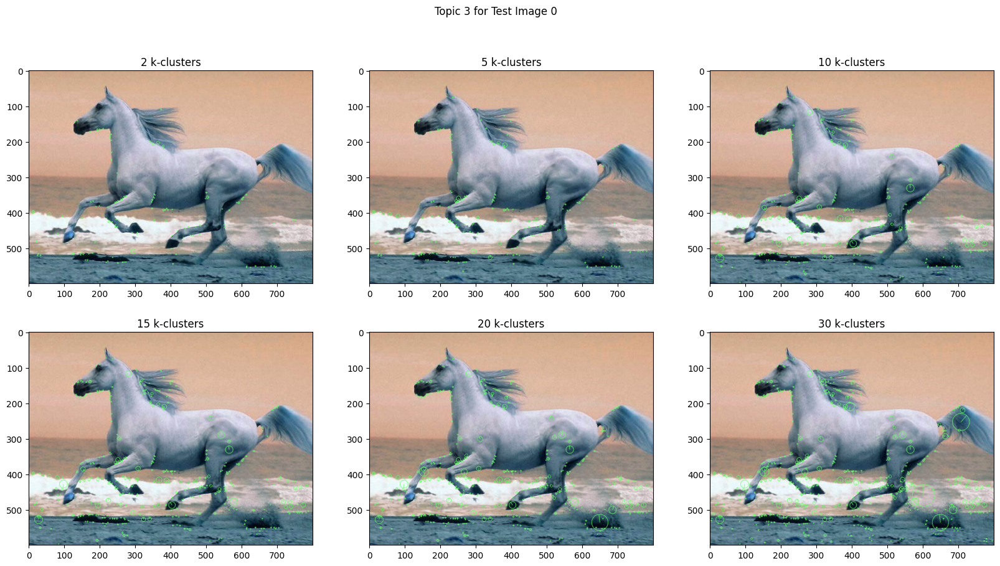

In [ ]:
fig, axs = plt.subplots(2,3)
fig.set_figheight(10)
fig.set_figwidth(20)

print("Topic {} for Test Image 1".format(top_topics[1]))
for i, no in enumerate([2, 5, 10, 15, 20, 30]):
  img = draw_keypoints(lda, top_topics[1], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], no, (100,255,100), False)
  axs[i // 3, i % 3].imshow(img)

  axs[i // 3, i % 3].title.set_text("{} k-clusters".format(no))

fig.suptitle("Topic {} for Test Image 0".format(top_topics[1]))
fig.show()

For the second topic, the clusters start to focus more on the sand the horse is walking in, and then it focuses on different aspects of the horse like: hair, nose, eyes, ears, legs. Taking the first 10 clusters of the 2$^{nd}$ topic we see that the most SIFT descriptors are located on the horse andon the sand. Few of them starts to go on the wave of the sea.

Now, let's take 3 other images, and see how their most probable topic looks like on them.

In [ ]:
tests_hist = [X_test_hist[i] for i in range(10)]
a = lda.transform(tests_hist)
np.set_printoptions(precision=5, suppress=True)
print("The predictions by each topic:\n", a)
top_topics = (-a).argsort(axis=1)
print("Most probable topics in order:\n", top_topics)

The predictions by each topic:
 [[0.00016 0.11546 0.70873 0.17549 0.00016]
 [0.5532  0.00012 0.23276 0.21381 0.00012]
 [0.00071 0.00071 0.19566 0.80222 0.00071]
 [0.65949 0.00022 0.17216 0.16791 0.00022]
 [0.07359 0.25895 0.0002  0.66706 0.0002 ]
 [0.31193 0.25751 0.07308 0.35724 0.00024]
 [0.42817 0.00004 0.12659 0.1085  0.3367 ]
 [0.00014 0.3672  0.20075 0.43178 0.00014]
 [0.61528 0.00242 0.0594  0.12584 0.19707]
 [0.83179 0.12778 0.00018 0.00822 0.03202]]
Most probable topics in order:
 [[2 3 1 4 0]
 [0 2 3 1 4]
 [3 2 1 0 4]
 [0 2 3 1 4]
 [3 1 0 2 4]
 [3 0 1 2 4]
 [0 4 2 3 1]
 [3 1 2 4 0]
 [0 4 3 2 1]
 [0 1 4 3 2]]


It seems that the last topic always has a bad prediction. Also the first and the 4th topics are the most likely to be in the image.

Let's see the first 10 visual terms for each topic on the test images

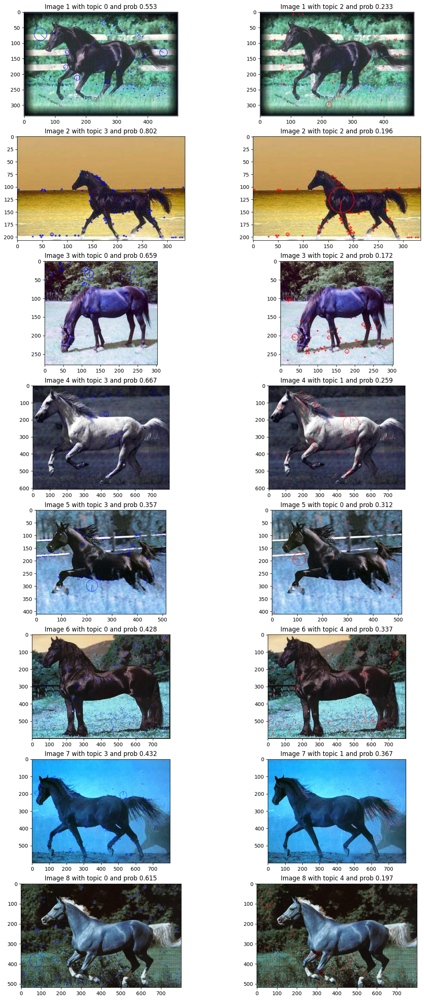

In [ ]:
fig, axs = plt.subplots(8,2)
fig.set_figwidth(15)
fig.set_figheight(34)
for i in range(8):
  nearest_k = kmeans.predict(X_test[i + 1])

  img = draw_keypoints(lda, top_topics[i + 1][0], nearest_k, X_test_keypoints[i + 1], X_test_images[i + 1], 5, (0,0,255), False)
  axs[i,0].imshow(img)
  axs[i,0].title.set_text("Image {} with topic {} and prob {:.3f}".format(i+ 1, top_topics[i + 1][0], a[i + 1, top_topics[i + 1][0]]))

  img = draw_keypoints(lda, top_topics[i + 1][1], nearest_k, X_test_keypoints[i + 1], X_test_images[i + 1], 5, (255, 0, 0), False)
  axs[i,1].imshow(img)
  axs[i,1].title.set_text("Image {} with topic {} and prob {:.3f}".format(i + 1, top_topics[i + 1][1], a[i + 1, top_topics[i + 1][1]]))

fig.show()

If we follow only topic 3, we will observe that it always go to the edges of not only the horse, but also the fences or trees in some cases (best seen at picture 5). The second most popular is the topic 0, but I am not sure what it is taking exactly. We can also look at it in a different way: let's the evolution of topic 0 in terms of selecting different k-clusters on the images with the higher prediction on this topic:

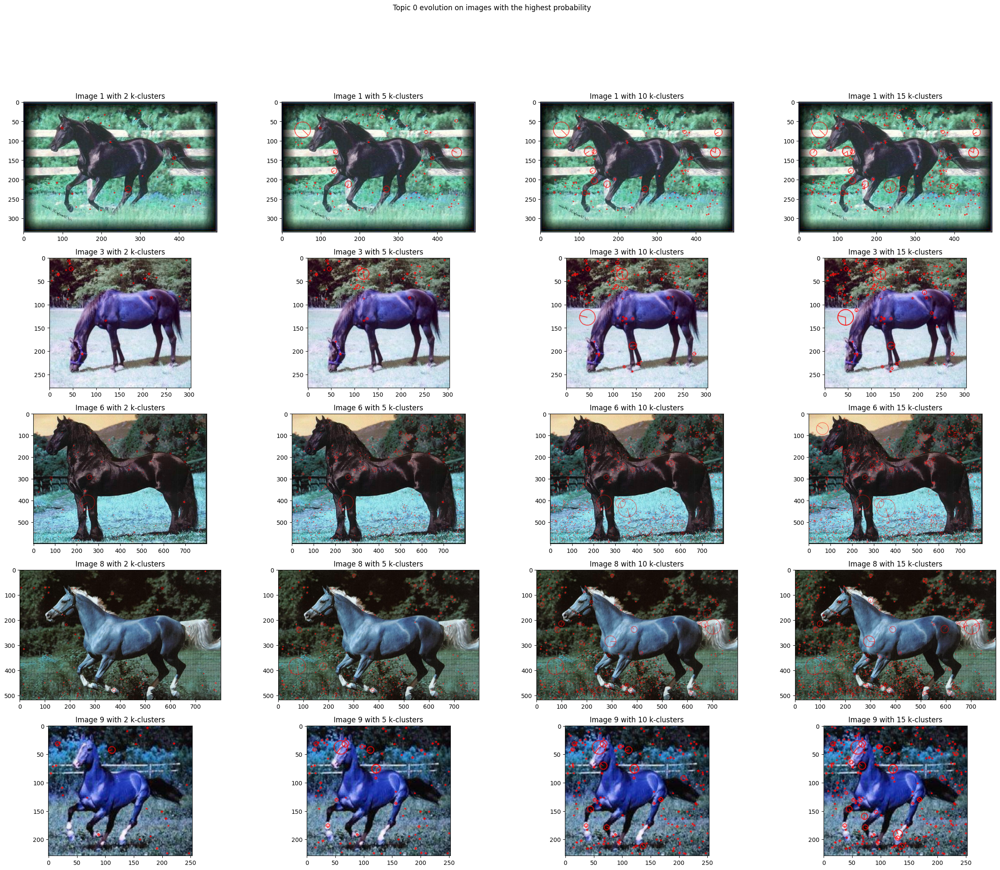

In [ ]:
fig, axs = plt.subplots(5,4)
fig.set_figwidth(30)
fig.set_figheight(23)
for index, i in enumerate([1,3,6,8,9]):
  nearest_k = kmeans.predict(X_test[i])

  for j, no in enumerate([2,5,10,15]):
    img = draw_keypoints(lda, 0, nearest_k, X_test_keypoints[i], X_test_images[i], no, (255,0,0), False)
    axs[index,j].imshow(img)
    axs[index,j].title.set_text("Image {} with {} k-clusters".format(i, no))

fig.suptitle("Topic 0 evolution on images with the highest probability")
fig.show()

Even though topic 0 is an important topic from the perspective of the results on the test images, it cannot be "generalized" into a specific category.

We observe that all of the images are green in general, and it is starting to select the descriptors from the background, but not in all the cases.

By that logic, we can say that the model detected a topic in the green environment. We can take the images from test and see what are the other topic it detected for each one of them. There is still a mistery for topic 1, 2 and 4, so we will only select 3 images of each and show them by selecting 5 visual terms for each of the image.

In [ ]:
fig, axs = plt.subplots(3,3)
fig.set_figwidth(30)
fig.set_figheight(19)
b = lda.transform(X_train_hist)
top_topics_train = (-b).argsort(axis=1)
for index, i_topic in enumerate([1,2,4]):
  index_images = [i for i in range(len(top_topics_train)) if top_topics_train[i][0] == i_topic]
  for j in range(3):
    if j < len(index_images):
      nearest_k = kmeans.predict(X_train[index_images[j]])
      img = draw_keypoints(lda, 0, nearest_k, X_train_keypoints[index_images[j]], X_train_images[index_images[j]], 5, (255,0,0), False)
      axs[index,j].imshow(img)
      axs[index,j].title.set_text("Image {} with topic {} with prob".format(index_images[j], i_topic, b[index_images[j]][0]))

fig.show()

These are the other 3 topics on 3 images from the train set. From my point of view, it cannot be visible a certain topic for each of them, but interestingly enough, on topic 4, the model chooses the keypoints on the horse or on the background (best seen in image 16 and 20).

# Second experiment

After this experiment with 5 topics on the image, I consider that some of the topics identified are not that useful, so, in that matter, we will try something else: if we have more k-clusters and only 3 topics, maybe we can diffirentiate the horse from the background, or at least the edges from the image.

We will apply KMeans with 250 k-clusters and LDA with 3 topics

In [ ]:
k = 250
kmeans_2 = KMeans(k, n_init='auto')

X_train_reformed = np.concatenate(X_train, axis=0)

np.random.shuffle(X_train_reformed)
X_train_smaller = X_train_reformed[:100000]

kmeans_2.fit(X_train_smaller)

KMeans(n_clusters=250, n_init='auto')

Again, convert our image descriptors into bag of visual terms

In [ ]:
X_train_hist = []
X_test_hist = []

for image_descriptors in X_train:
  nearest_k = kmeans_2.predict(image_descriptors)
  X_train_hist.append(np.histogram(nearest_k, np.arange(k + 1))[0])

for image_descriptors in X_test:
  nearest_k = kmeans_2.predict(image_descriptors)
  X_test_hist.append(np.histogram(nearest_k, np.arange(k + 1))[0])

Apply LDA:

In [ ]:
lda = LDA(n_components=3)

lda.fit(X_train_hist);

And let's see the results on the first picture:

The predictions by each topic: [0.28948 0.00172 0.7088 ]
[207  38 180  79  28 227  90 210  30  10  21 124  42 136 200]
[243  20 100 117 208 249 209 142  96  72 247 145 102 237 235]
[194 216   5 122 128 147  13  70 221  68 183  64 206 125 140]


[]

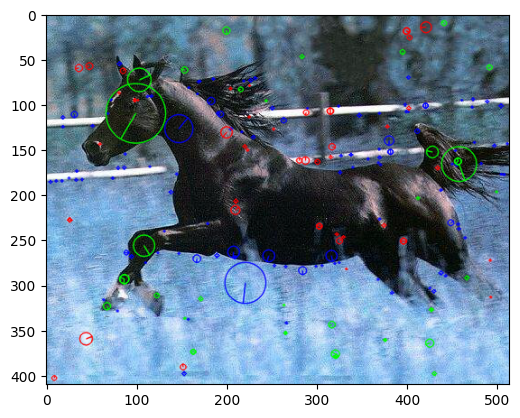

In [ ]:
test_index = 5
topic_probs = lda.transform([X_test_hist[test_index]])[0]
print("The predictions by each topic:", topic_probs)
top_topics = (-topic_probs).argsort()

nearest_k = kmeans_2.predict(X_test[test_index])

img = draw_keypoints(lda, top_topics[0], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], 15, (0,0,255))
img = draw_keypoints(lda, top_topics[1], nearest_k, X_test_keypoints[test_index], img, 15, (255,0,0))
img = draw_keypoints(lda, top_topics[2], nearest_k, X_test_keypoints[test_index], img, 15, (0,255,0))

plt.imshow(img)
plt.plot()

It seems that there is still a topic which goes to the edges of the image. Let's see what it actually returns on the first topic changing the number of k-clusters we choose to see:

Topic 2 for Test Image 5


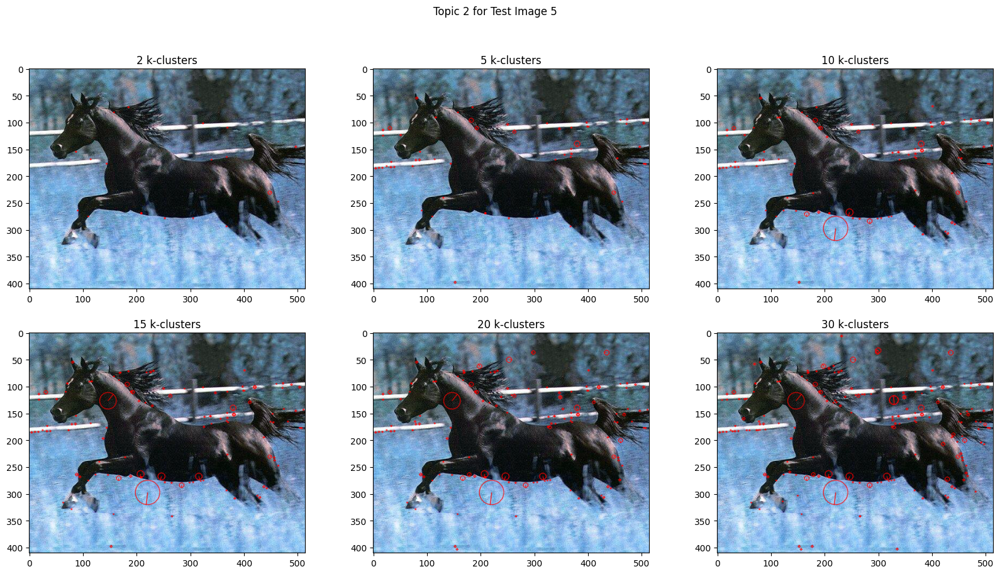

In [ ]:
fig, axs = plt.subplots(2,3)
fig.set_figheight(10)
fig.set_figwidth(20)
print("Topic {} for Test Image {}".format(top_topics[0], test_index))
for i, no in enumerate([2, 5, 10, 15, 20, 30]):
  img = draw_keypoints(lda, top_topics[0], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], no, (255,0,0), False)
  axs[i // 3, i % 3].imshow(img)

  axs[i // 3, i % 3].title.set_text("{} k-clusters".format(no))

fig.suptitle("Topic {} for Test Image 5".format(top_topics[0]))
fig.show()

The results have a better topic over the edge when we select more visual terms. Let's see the second one

Topic 0 for Test Image 5


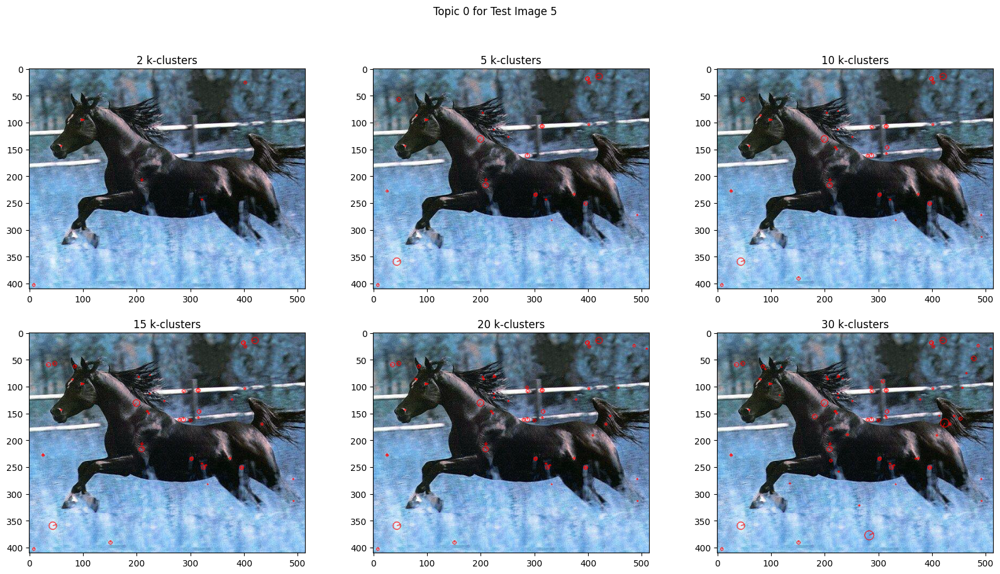

In [ ]:
fig, axs = plt.subplots(2,3)
fig.set_figheight(10)
fig.set_figwidth(20)
print("Topic {} for Test Image {}".format(top_topics[1], test_index))
for i, no in enumerate([2, 5, 10, 15, 20, 30]):
  img = draw_keypoints(lda, top_topics[1], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], no, (255,0,0), False)
  axs[i // 3, i % 3].imshow(img)

  axs[i // 3, i % 3].title.set_text("{} k-clusters".format(no))

fig.suptitle("Topic {} for Test Image 5".format(top_topics[1]))
fig.show()

And the first 3 topics on all of the other images from test:

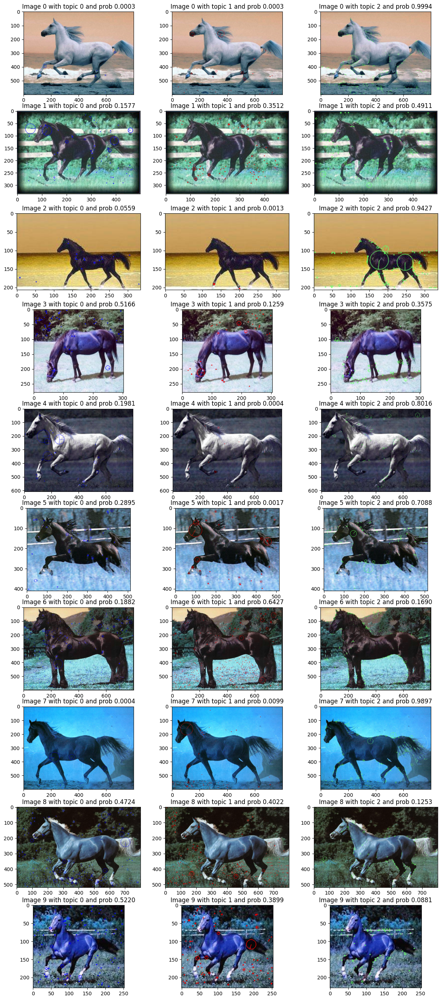

In [ ]:
tests_hist = [X_test_hist[i] for i in range(10)]
a = lda.transform(tests_hist)
np.set_printoptions(precision=5, suppress=True)

fig, axs = plt.subplots(10,3)
fig.set_figwidth(15)
fig.set_figheight(35)
for i in range(10):
  nearest_k = kmeans_2.predict(X_test[i])

  img = draw_keypoints(lda, 0, nearest_k, X_test_keypoints[i], X_test_images[i], 15, (0,0,255), False)
  axs[i,0].imshow(img)
  axs[i,0].title.set_text("Image {} with topic {} and prob {:.4f}".format(i, 0, a[i][0]))

  img = draw_keypoints(lda, 1, nearest_k, X_test_keypoints[i], X_test_images[i], 15, (255, 0, 0), False)
  axs[i,1].imshow(img)
  axs[i,1].title.set_text("Image {} with topic {} and prob {:.4f}".format(i, 1, a[i][1]))

  img = draw_keypoints(lda, 2, nearest_k, X_test_keypoints[i], X_test_images[i], 15, (100, 255, 100), False)
  axs[i,2].imshow(img)
  axs[i,2].title.set_text("Image {} with topic {} and prob {:.4f}".format(i, 2, a[i][2]))

fig.show()

We observe that again we have a topic which goes to the edges of a picture (in our case, topic 2), and the other 2 topics which are not clear enough.

From the perspective of the probability given by the model, if it the probability is high/ the highest, than it detected background in the image, but otherwise it does not seem to do anything else from these 2 points. It kind of goes into the green direction, which gives them a higher probability (0,2,4,5,7 are the ones wihtout green predominant and the highest probability is received by the topic 2, with the edges of the horse).  

A third model has to be evaluated,

# Third experiment

KMeans will be the same: 250, and LDA with number of components equal to 10, and also we will use the other implementation of LDA.

The predictions by each topic: [2.07397281e-01 1.29605590e-01 3.69220729e-01 1.19366594e-04
 1.83372606e-01 1.19364381e-04 1.19365146e-04 1.19355627e-04
 2.55268980e-03 1.07373652e-01]
[118 207 126 177  39 200 143 166  84 149 191   7 185 117  74   4  14  43
   5  80 244 161 193 152 142  90  36 110 158 112]
[177 143  14 111 152  92 216 142  96  56 117  90 243  68 144 163   4  79
  34  64 185 239 165 180  47 227  48 136  57 191]
[123 177 206  45  62 221 135  90 143  58 129 225 241   9 218 231 222 181
 233 248  99 208 201 153  65 174 138 127 125  14]


[]

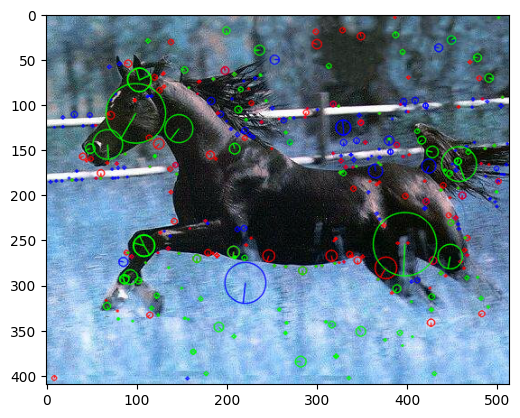

In [ ]:
k = 250
kmeans_2 = KMeans(k, n_init='auto')

X_train_reformed = np.concatenate(X_train, axis=0)

np.random.shuffle(X_train_reformed)
X_train_smaller = X_train_reformed[:100000]

kmeans_2.fit(X_train_smaller)

X_train_hist = []
X_test_hist = []

# for training images
for image_descriptors in X_train:
  # nevermind there is already a function "predict" in that manner
  nearest_k = kmeans_2.predict(image_descriptors)
  X_train_hist.append(np.histogram(nearest_k, np.arange(k + 1))[0])

# for test images as well
for image_descriptors in X_test:
  nearest_k = kmeans_2.predict(image_descriptors)
  X_test_hist.append(np.histogram(nearest_k, np.arange(k + 1))[0])


lda = LDA(n_components=10)

lda.fit(X_train_hist)

test_index = 5
topic_probs = lda.transform([X_test_hist[test_index]])[0]
print("The predictions by each topic:", topic_probs)
top_topics = (-topic_probs).argsort()

nearest_k = kmeans_2.predict(X_test[test_index])

img = draw_keypoints(lda, top_topics[0], nearest_k, X_test_keypoints[test_index], X_test_images[test_index], 30, (0,0,255))
img = draw_keypoints(lda, top_topics[1], nearest_k, X_test_keypoints[test_index], img, 30, (255,0,0))
img = draw_keypoints(lda, top_topics[2], nearest_k, X_test_keypoints[test_index], img, 30, (0,255,0))

plt.imshow(img)
plt.plot()

And of course, let's see on all of the test images!!

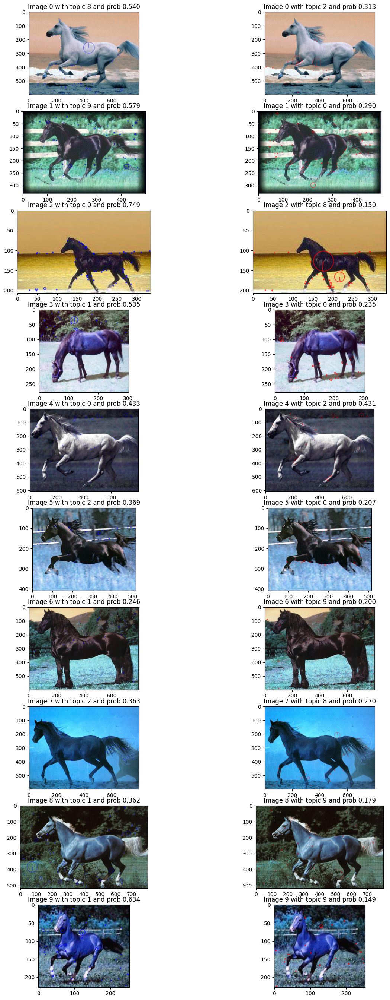

In [ ]:
fig, axs = plt.subplots(10,2)
fig.set_figwidth(15)
fig.set_figheight(34)

topic_probs = lda.transform(X_test_hist)
np.set_printoptions(precision=5, suppress=True)
top_topics = (-topic_probs).argsort(axis=1)

for i in range(10):
  nearest_k = kmeans_2.predict(X_test[i])

  img = draw_keypoints(lda, top_topics[i][0], nearest_k, X_test_keypoints[i], X_test_images[i], 5, (0,0,255), False)
  axs[i,0].imshow(img)
  axs[i,0].title.set_text("Image {} with topic {} and prob {:.3f}".format(i, top_topics[i][0], topic_probs[i, top_topics[i][0]]))

  img = draw_keypoints(lda, top_topics[i][1], nearest_k, X_test_keypoints[i], X_test_images[i], 5, (255, 0, 0), False)
  axs[i,1].imshow(img)
  axs[i,1].title.set_text("Image {} with topic {} and prob {:.3f}".format(i, top_topics[i][1], topic_probs[i, top_topics[i][1]]))

fig.show()

If we look at the results of the first experiment, with LDA model with 5 topics with 100 visual terms, the results seems to go in the same direction as this one: most pictures are having the same topics as the results from the 5 topics, but lower predictions. The results from this test are not amazing, but now we know that it is not a necessary a large number of topics to achieve a better topic modelling.

# Personal Considerations

1. Bag of visual terms was harder to understand from the idea of bag of words, but the main idea is that your words are not the SIFT descriptors, but the cluster which is predicted by that SIFT descriptor. In this way, you can imply the same concept as the bag of words.
2. LDA is a very interesting model, and also has a big complexity in terms of mathematics and probabilistics (for me at least), but I personally consider that its usage is really complicated in terms of industrial and research field. After a bit of research, I've read that it is good for a preprocessing step for other models, and also augmentation. I hope this idea would come into my mind if I ever work with model that would need that. From another perspectives, it is useful to find patterns in your documents which were not observable until then.
3. As previously said, LDA is really complex from my perspective, and I really understood the model, but there is still lack of knowledge in terms of training with Expectation-Maximization and with the Dirichlet Distribution. A better understanding of the model would help me achieve better results, which I will try later on.
4. The working of the LDA model with SIFT descriptors from horse images was not as I expected at all: my idea was to at least separate the background and to identify the horse. Instead, the topics revealed a pattern of green background and the edges from the entire picture.
5. I discovered a metric called the "coherence score" metric, which gives us how interpretable the topics are to humans. It would have been useful for this exercise, instead of experimenting with a different size in number of topics, but I was not sure how to implement it in terms of topics. Maybe next time I should try using the "gensim" library for LDA, which already has an implementation for that metric. There are different formulas in this manner, but these ones seems to be better implemented for our problem - https://www.baeldung.com/cs/topic-modeling-coherence-score.
6. In other experiments which are not available here, I have tried with a few k-clusters (25 and 50), but the descriptors were not spread enough, and if I selected only one visual term it would select more than it should have. In contrast, I also tried with more k-clusters (1000), but then it was hard to work with how many visual terms to choose for plotting and observing the results. Next, experiments with alpha changed maybe would have gone to different results, even though sklearn does not recommend to change it too much (only between 0.5 and 1).